Pictures were taken from here

https://github.com/Dyakonov/DL/blob/master/2022/DL_1NN_04learning_202201a.pdf
https://github.com/Dyakonov/DL/blob/master/2022/DL_3NLP_01rnn_202203a.pdf

# A Recipes for Training NNs from Andrej Karpathy (definitely must read)

http://karpathy.github.io/2019/04/25/recipe/

# Deep Learning Book (one of the best, but old)

https://www.deeplearningbook.org/

# NN: basics

Simplest NN (one neuron)

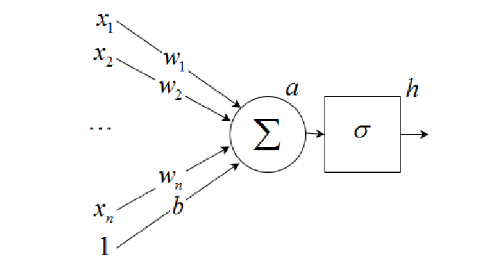

Neuron formula

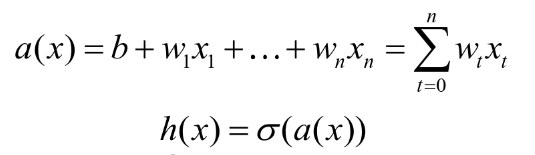

- b - bias
- σ - activation functon
- w<sub>t</sub> - connection weights

## Linear regression

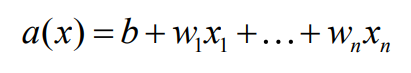

## Logistic regression

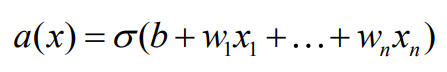

## Linear classifier

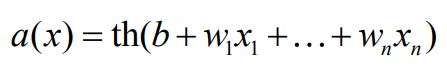

## Activation functions

### Linear activation function

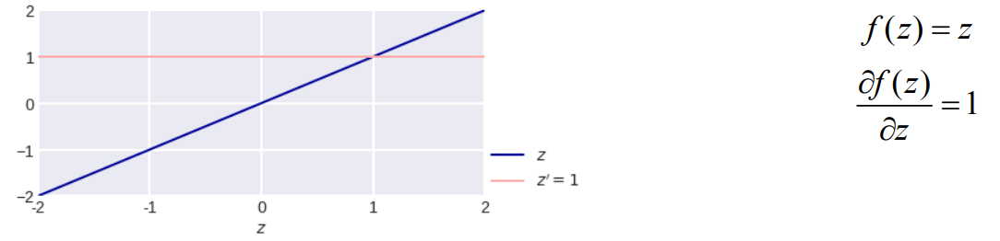

### Threshold function

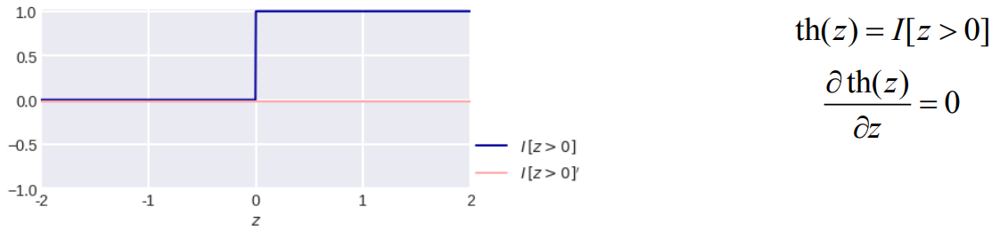

### Sigmoid activation function

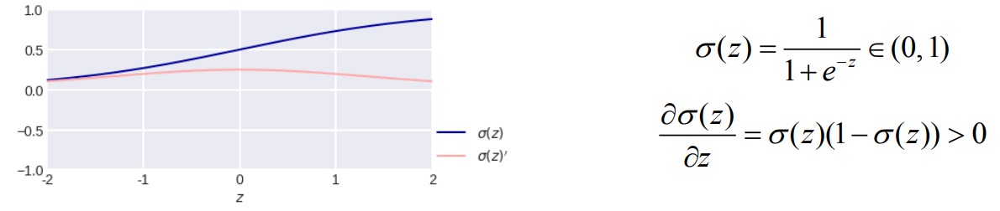

### Hyperbolic tangent

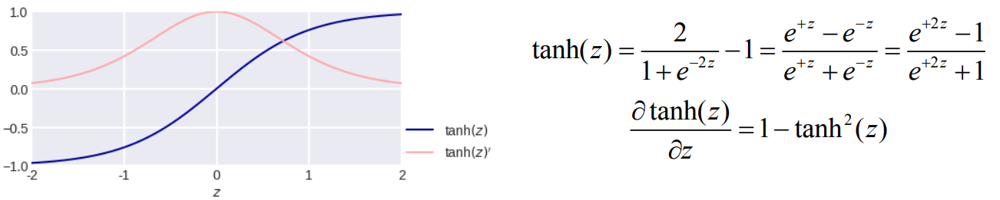

### LeakyReLU / ELU / SELU

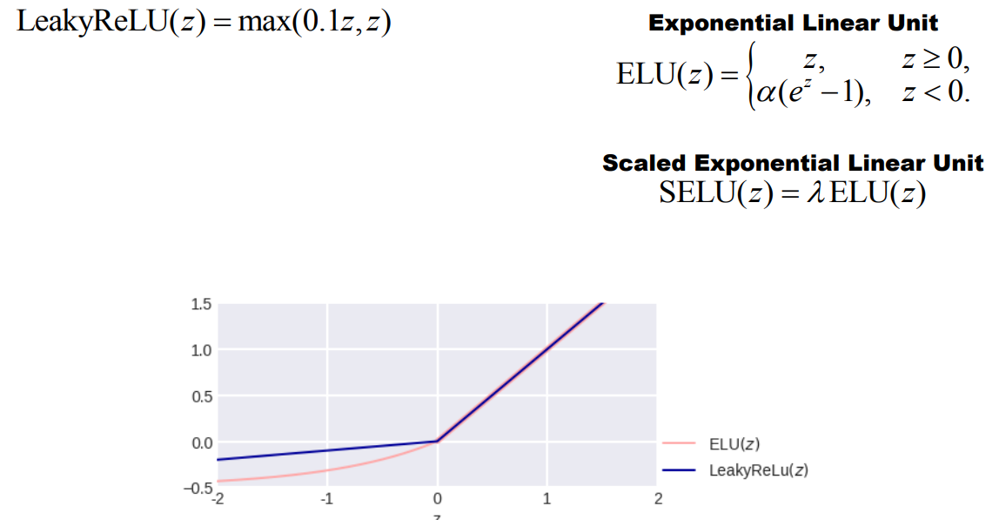

### swish

Replacing ReLU with swish in deep nets slightly increases quality of net (~1%)

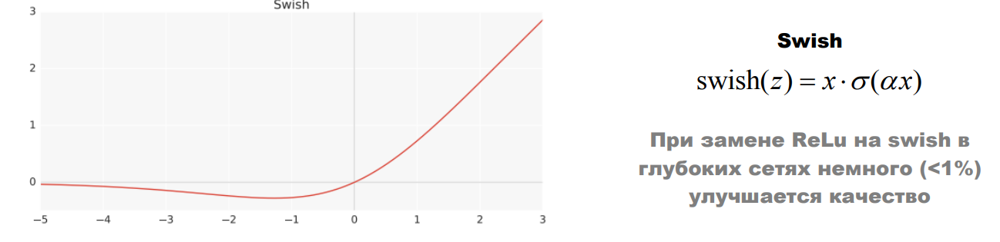

### Maxout / GLU

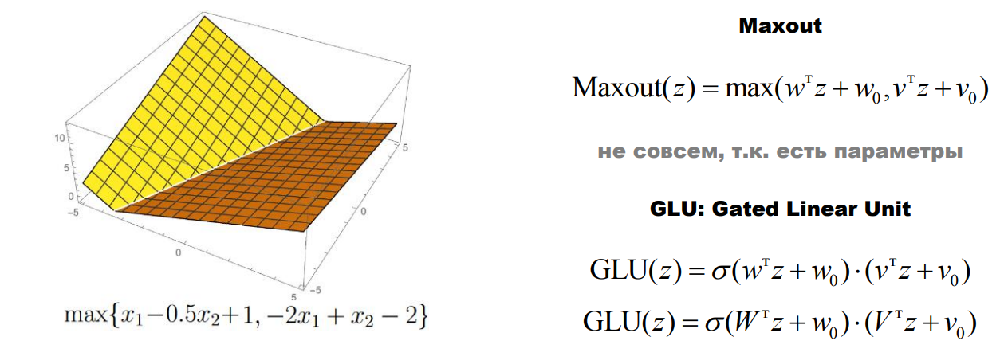

Activation function may be any, but it must be **non-polynomic**

### GeLU

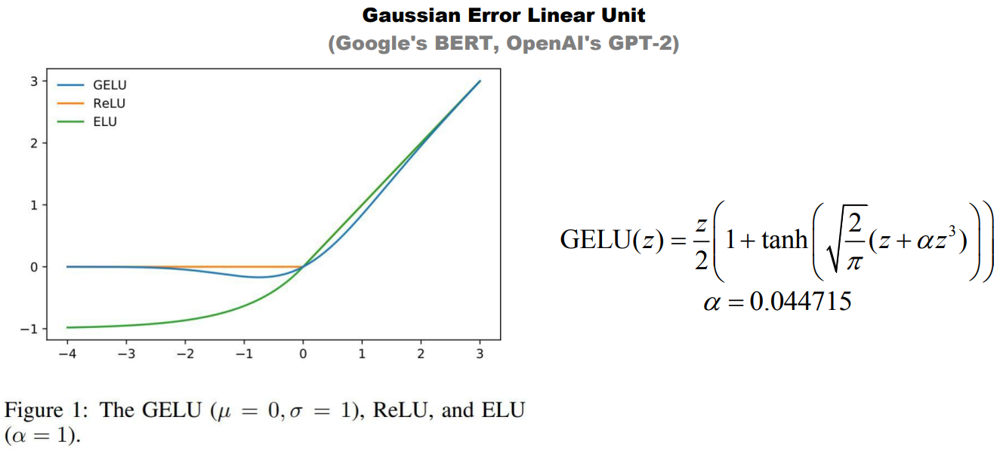

### Activation fucntion comparsion (CIFAR10)

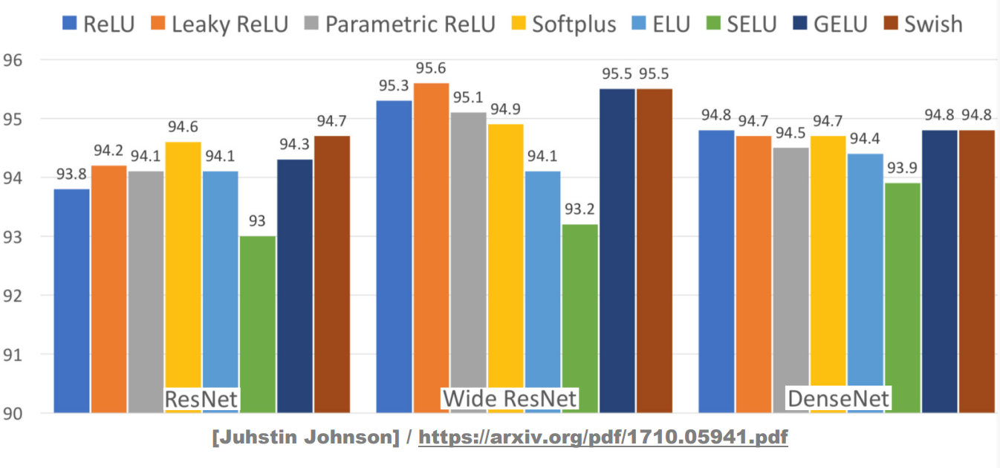

### Activation fucntion popularity

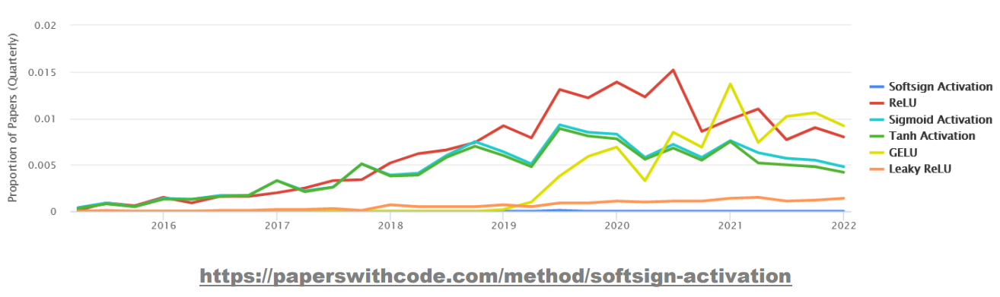

## Regression (left) vs classification (right) architechture

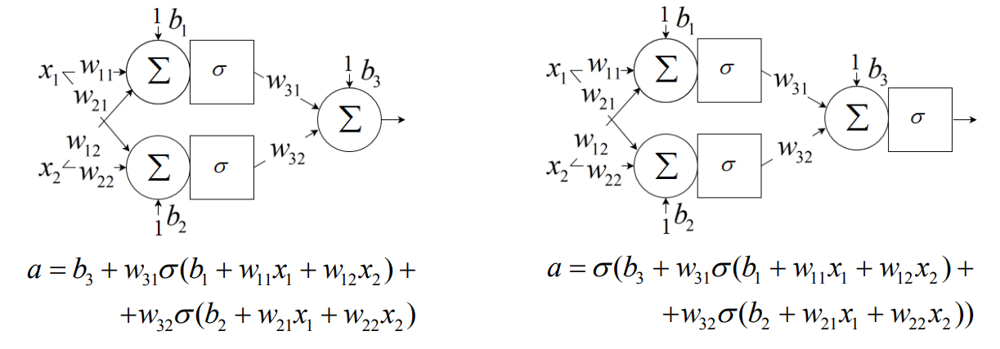

## 2-layer NN

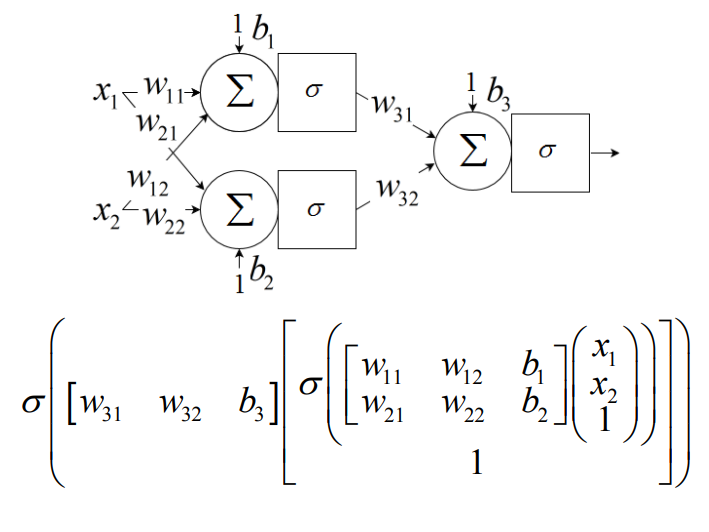

## Multilayer NN

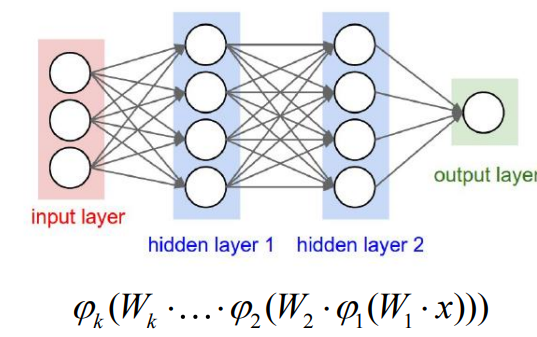

NN - **consecutive transformation of feature space**

## Why do we need Deep NNs?

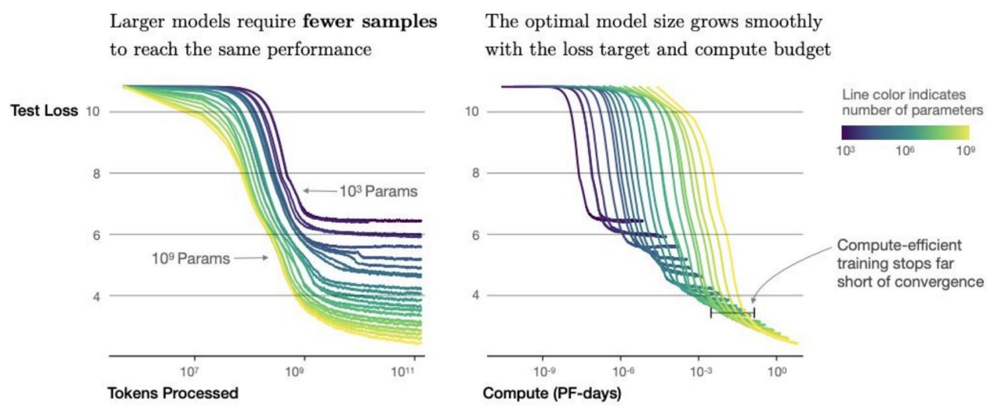

# NN training

As usual - minimizing of empirical risk

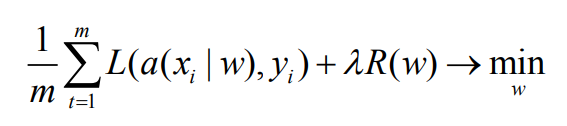

## SGD

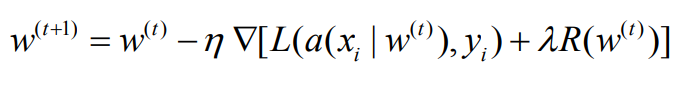

## Loss function

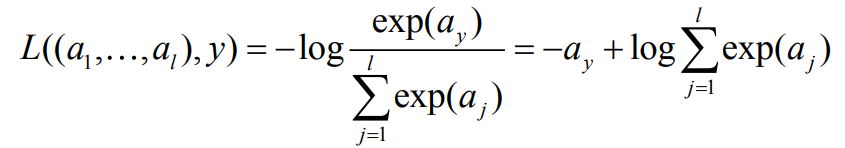

Implementation above is not stable (we have to sum exponents of big numbers), so frequently loss function is implemented like this:

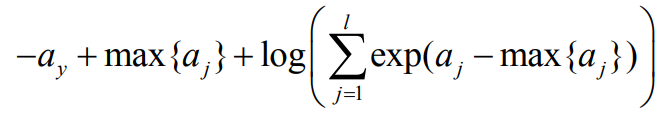

## Backpropagation

Idea: calculation of derivative of complicate function:

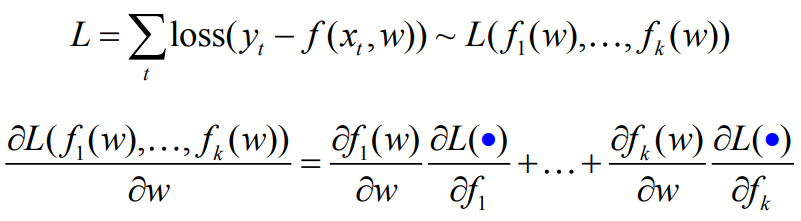

Blue text - where we calculate derivatives / gradients / jacobians

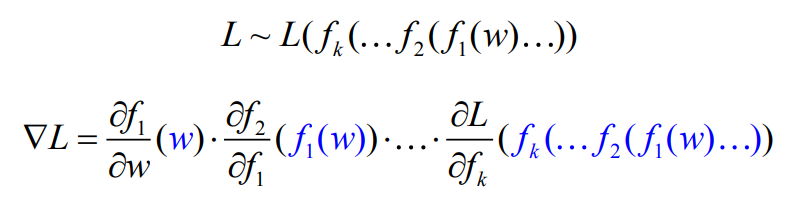


## Gradient calculation

x = 1, y = 2, z = 3

df/dx - ?

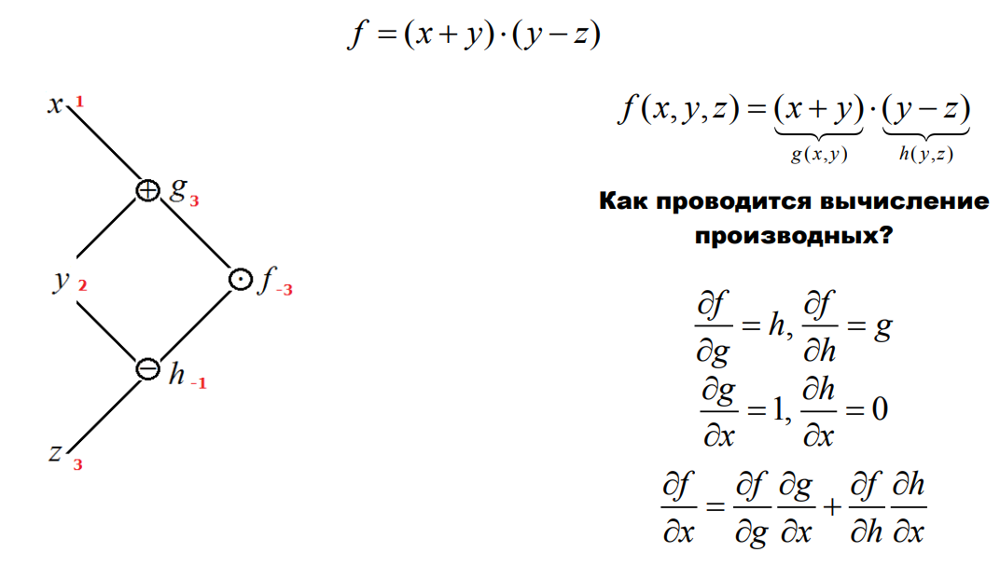

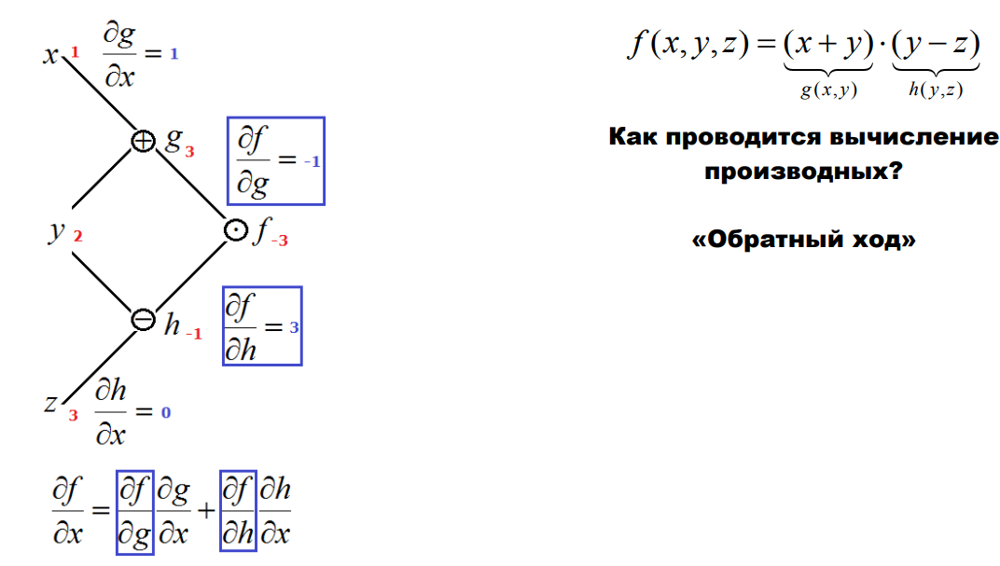

df/dx = -1

## How gradient passes basic gates (sum, multiplicaton, max)?

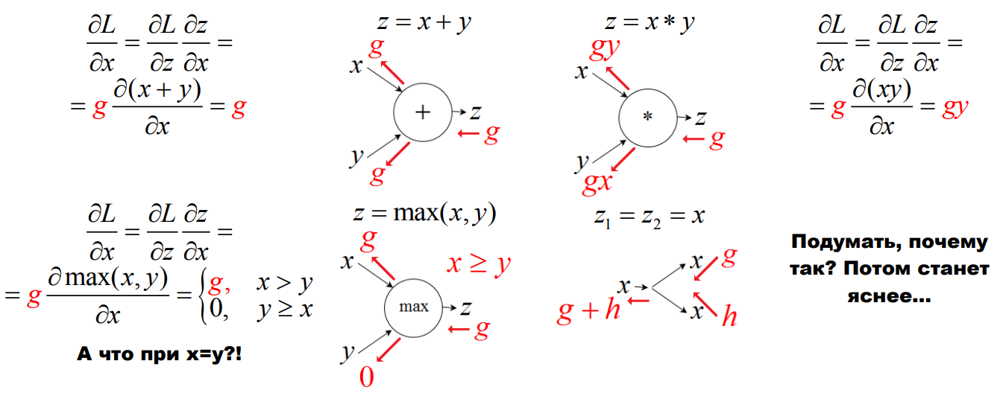

## Gradient propagation through gates

Derivative / gradient / Jacobian

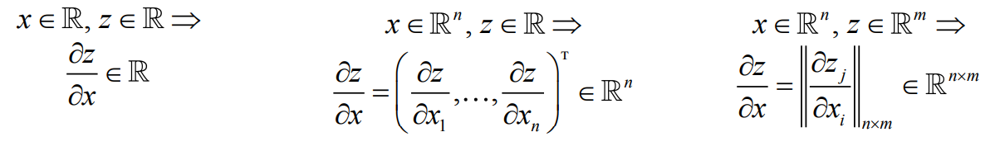

Jacobian matrix

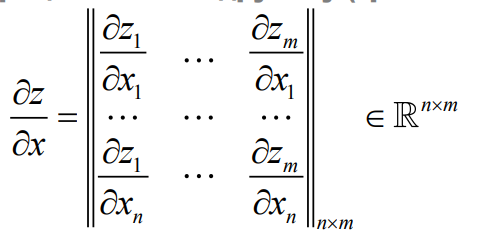

### Gradient propagation through MaxPool

Result is diagonal matrix

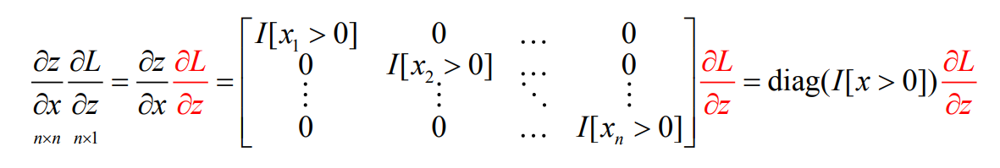

### Gradient propagation through Linear Layer

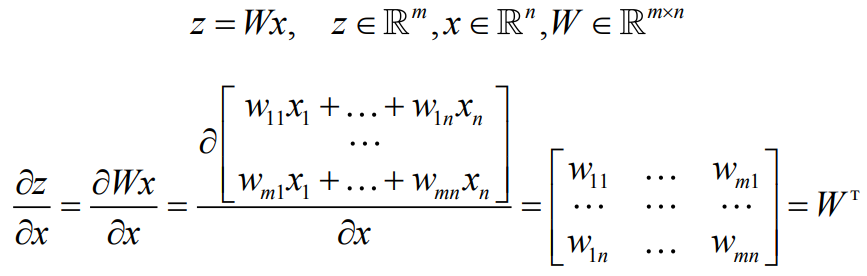

Result is W<sup>T</sup> 

### Gradient propagation through Linear Layer + activation

Result is W<sup>T</sup> * diagonal matrix

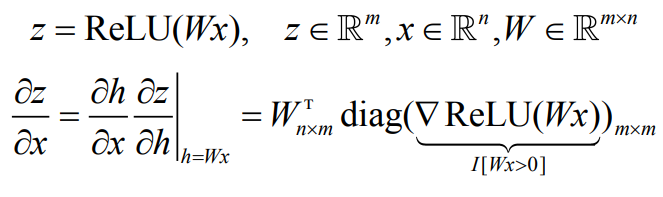

### Gradient propagation through multiple Linear Layers + activations

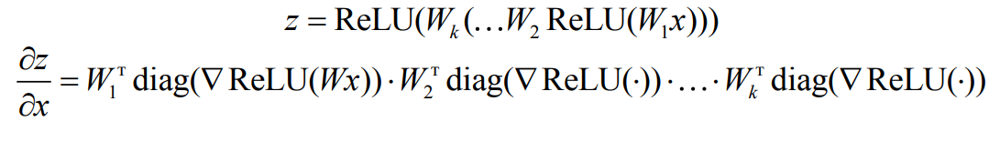

### Gradient propagation through neuron

φ'(.) - derivative of activation function

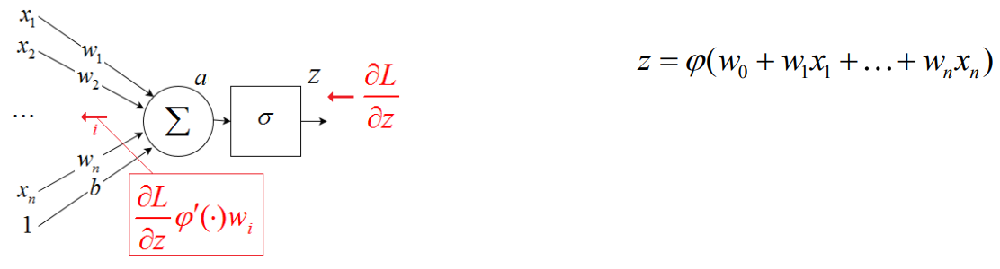

For gradient propagation:

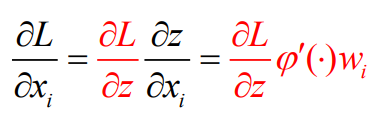

For weights correction:

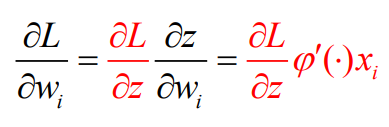

### Backpropagation main scheme

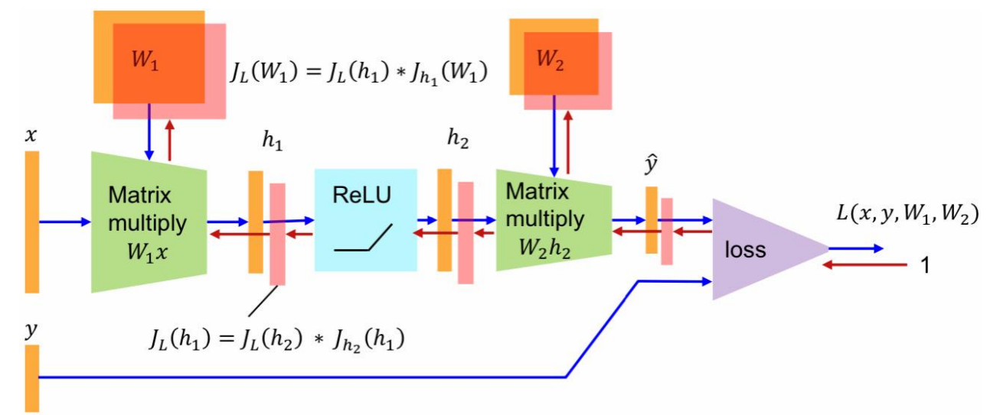

# Weight initialization

Very important for NN. Same NNs with different weight initialization can show completely different results (e.g. NNs with the same architechture but created with Pytorch and Tensorflow show different train/val curves and different performance results).

So when training, try to use different initializations.

Example could be found in NNs/Utils directory & via these links

https://pytorch.org/docs/stable/nn.init.html - Pytorch

https://www.tensorflow.org/api_docs/python/tf/keras/initializers - Tensorflow

# Batch size

You can make as big batch size as your RAM size lets, but it's better to use batch size that lead to maximal training speed up.

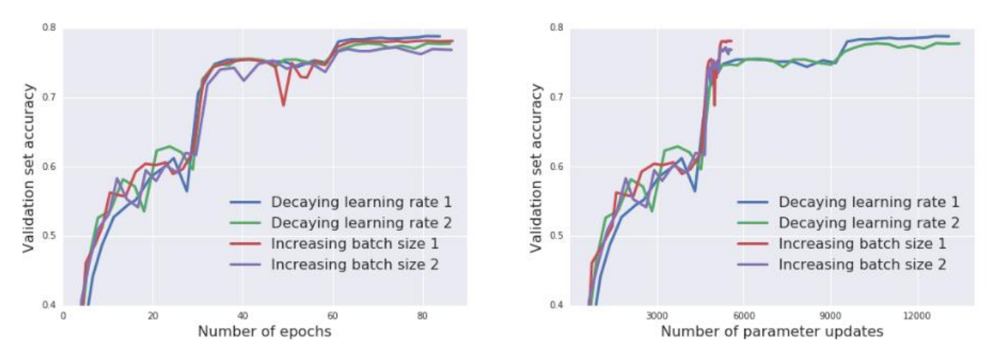

Increasing of batch size leads to the same effect as decreasing of learnig rate => may train slowly with huge batches. So when you increase your batch size, **you should increase your LR too**.



There is an opinion that optimal batch size is between 1 and 32.

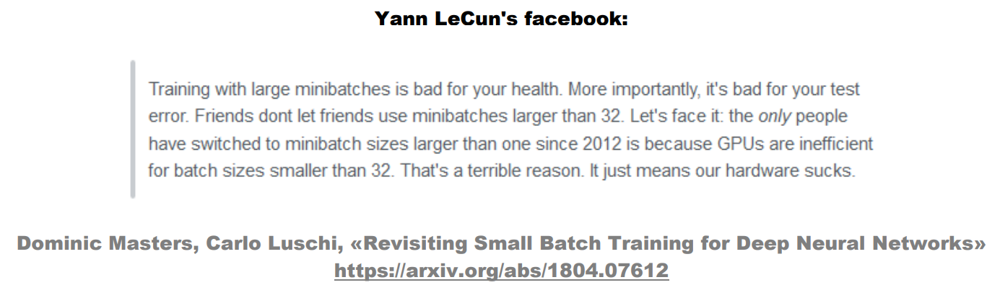

And this opinion has a theoretical explanation. SGD (batch size=1) better finds loss minimums of the loss function, when GD with huge batch size often finds sharp minimums instead of flat


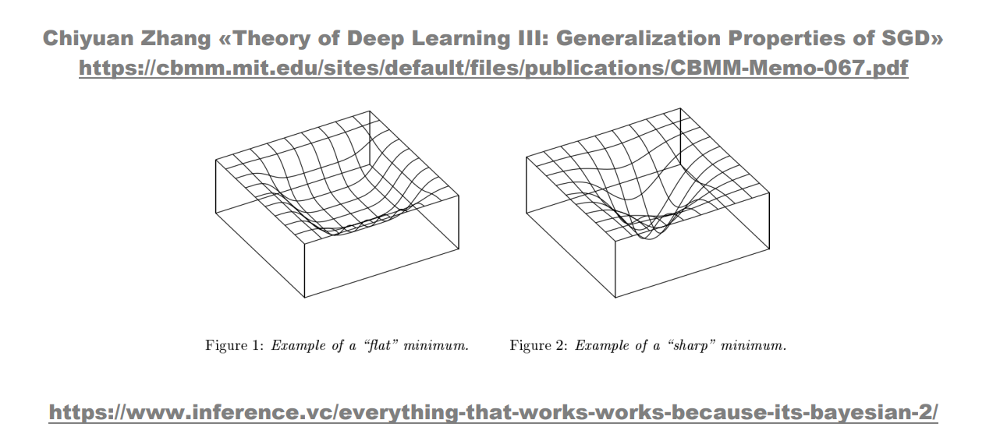

Why sharp minimum is worse than flat? Because it's not only deep but it's narrow and bias on the test set may lead to movement of the loss from deep point to relatively high => overfitting.

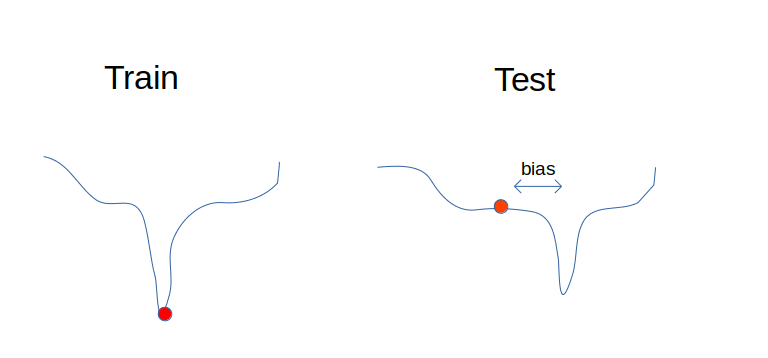

So it's better to look for the flat minimums with a small batch size, not for the sharp minimums with a huge one.

Train/test loss and batch size (128 and 512) dependence

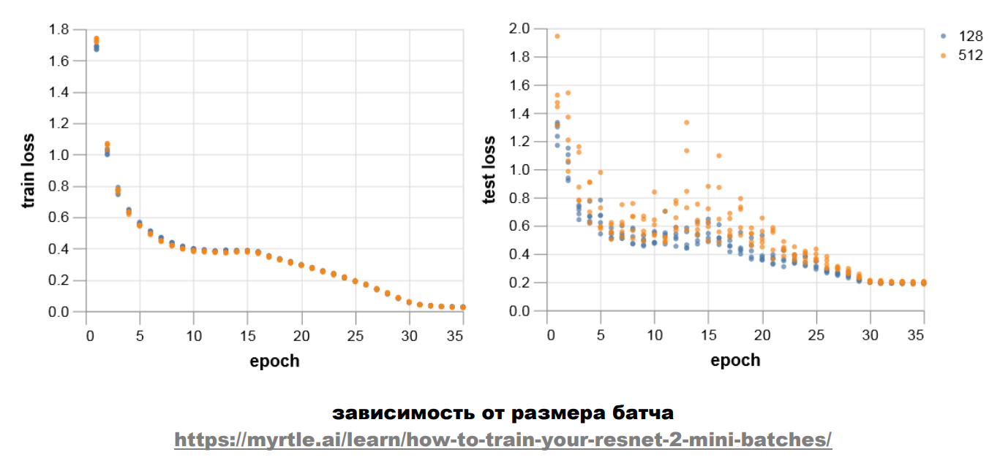

# Optimization methods

- look what authors of NN architechture use
- Adam is almost always good  
- if it's not - SGD + momentum


An overview of gradient descent optimization algorithms
https://ruder.io/optimizing-gradient-descent/

An updated overview of recent gradient descent algorithms
https://johnchenresearch.github.io/demon/

Rectified Adam (RAdam, 2019)
https://medium.com/@lessw/new-state-of-the-art-ai-optimizer-rectified-adam-radam5d854730807b

# Gradient noise

Sometime adding some noise to the gradient helps model to generalize better.

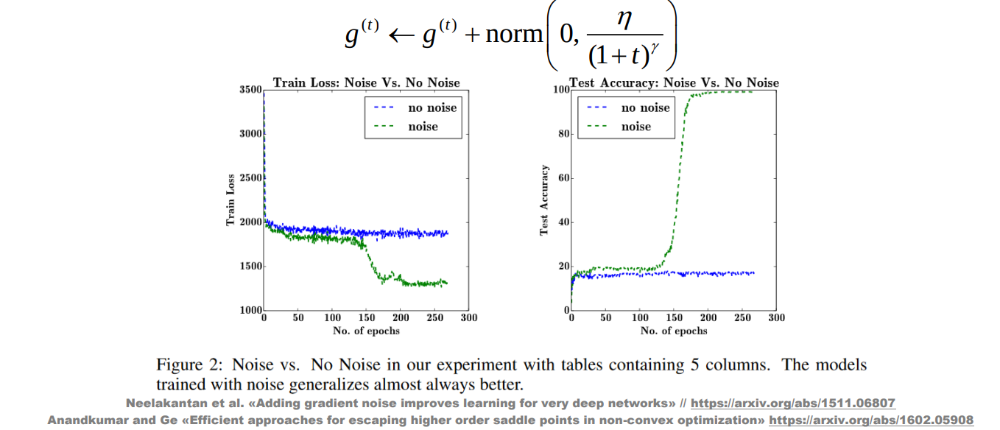

# Graident clipping

Prevents to huge gradients which can make difficulties with NN converging and finding loss minimums.
Gradient clipping is obviously applied after gradient calculation by before step of the optimizer.

Pytorch example can be found in NNs/Utils directory

# Dropout

Can be Standard (Bernoulli), Gaussian, Fast, Variational, Concrete etc.

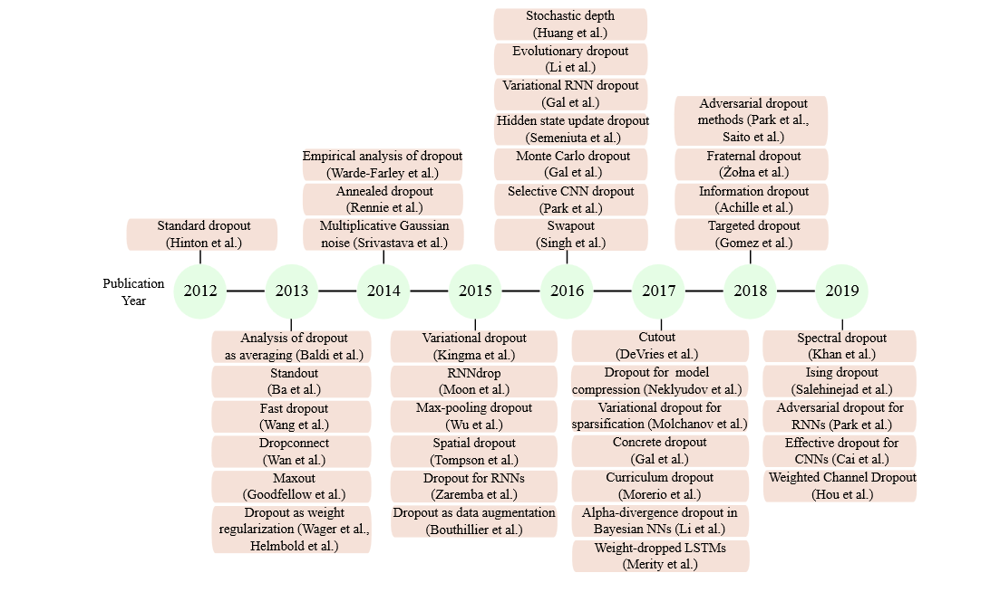

Pytorch and Tensorflow have only Bernoulli dropout, other Pytorch/Tensorflow dropout implementations can be googled.

# Weight decay

Important hyperparameter, basically it's L2 regularization for NN. So it's better to use it.

# Batch norm

- method of adaptive reparametrization, is used to deal with Covariate Shift (distribution of neuron's input signals may change after every batch training interation => distribution of neuron's output signal may change even more => distribution of input signals for neurons of the next layer may change drastically, etc... so the covariate shift is chaning of distributions of neuron inputs during the training; these changes may not fit with the previous weight updates and may lead to bad training results)
- another explanation of BN effectiveness is because it makes loss function more smooth:

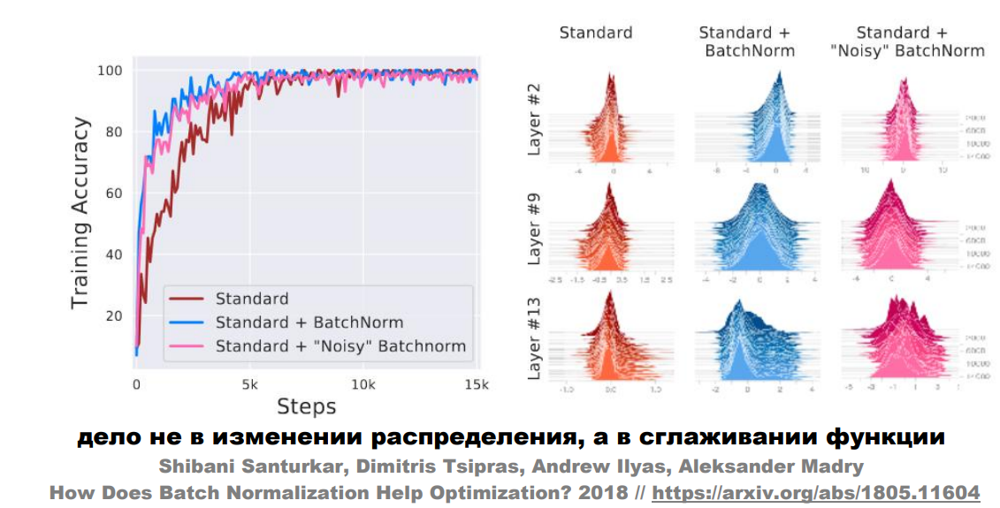

Normalization also can be 
- Layer (normalize all pixels and channels for every object in the batch)
- Instance (normalize all pixels for every object and channel in the batch)
- Group (normalize all pixels and channels inside some group for every object in the batch)

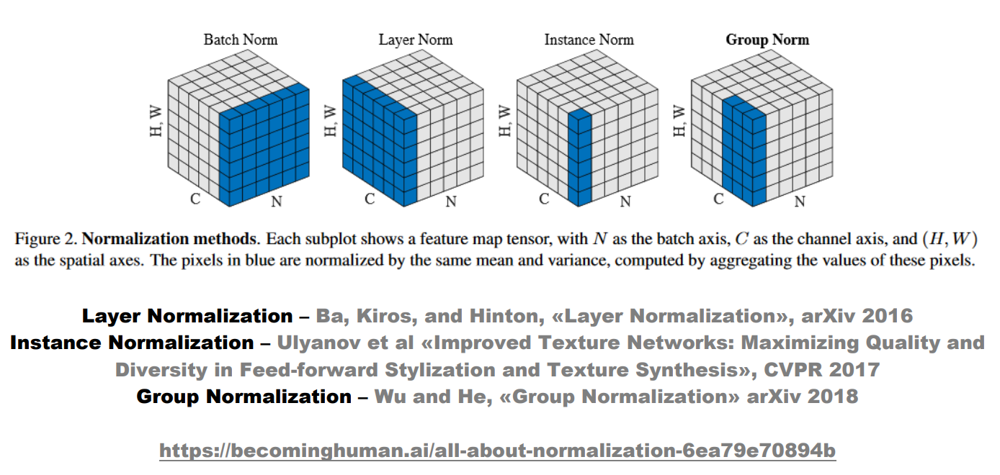

- BN layer is added before every layer (before or after activation function)
- if layer is Linear + BN => disable Linear layer's bias (BN will create it's own bias anyway)

BN benefits:

- can safely increase LR
- can safely remove Dropout
- can safely decrease Regularization/Weight decay
- can safely se deeper NNs
- NN becomes less sensitive to initialization method


With Batch Norm NN training process is more stable even with extremely high LR values

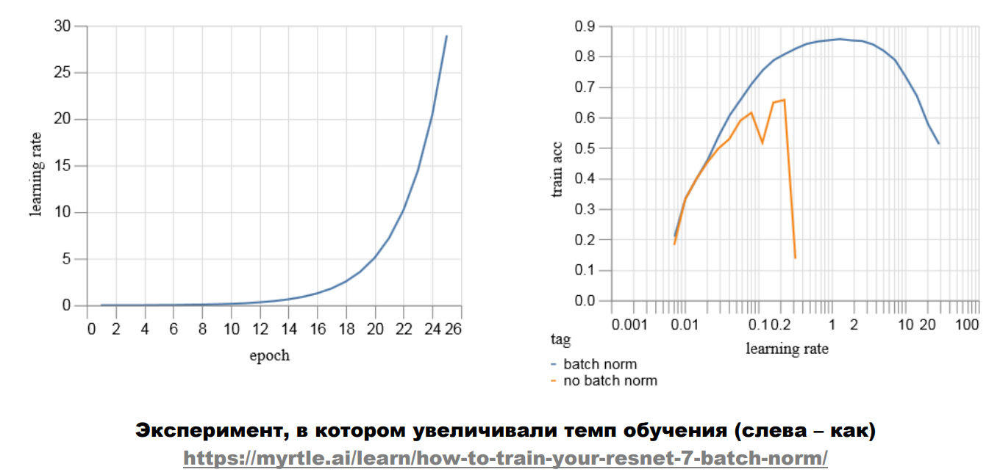

# Augmentation

May be

- simple (rotate, flip, resize)
- agressive (object spoiling - put mask on object, or put another object, object of another class etc.)
- creative (simulation, GANs, etc.)

Advanced augmentation examples

Mixup (mix two objects and ALSO mix their targets and train NN to predict these targets not like 1 and 0, but like 0.7 of class 1 and 0.3 of class 2)
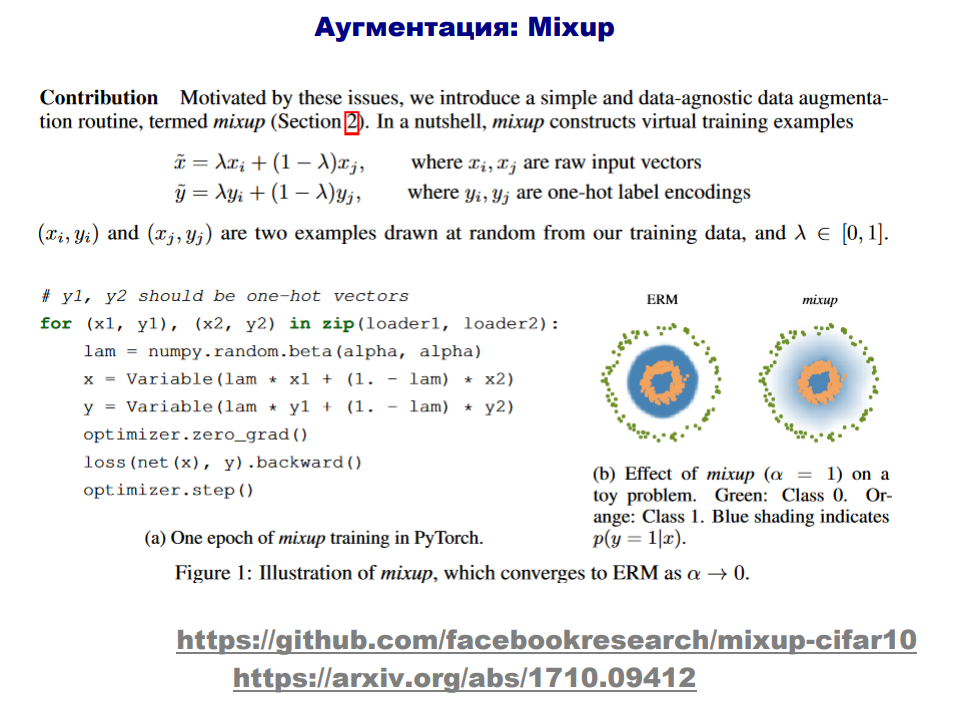

Cutout, CutMix

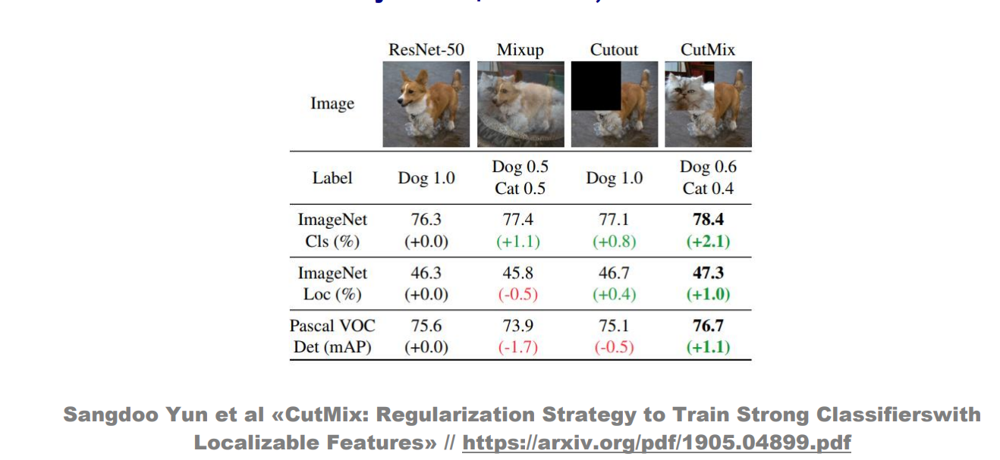

Attentive CutMix (mixup only areas of the highes NN's attention)

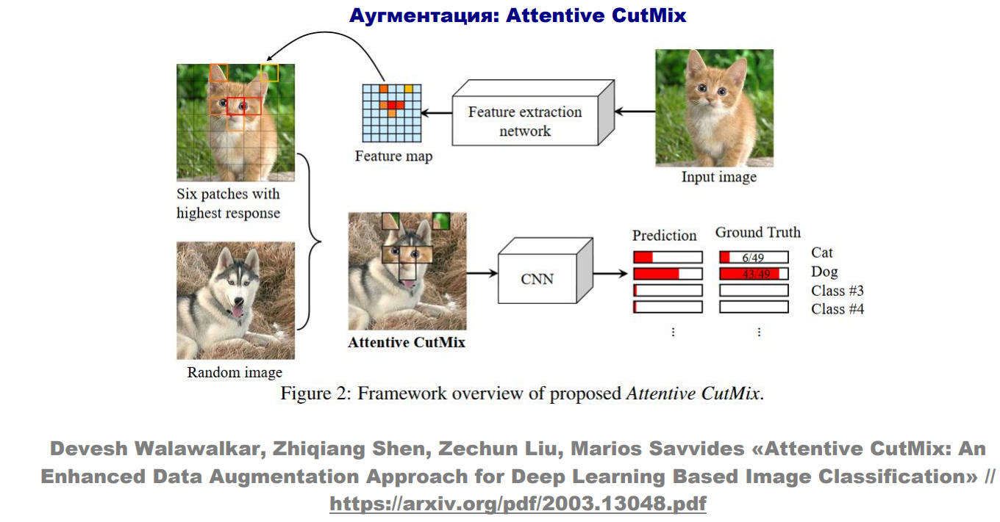

GridMask (don't let ConvNN to classify objects only by common patterns using grid masking of the picture)

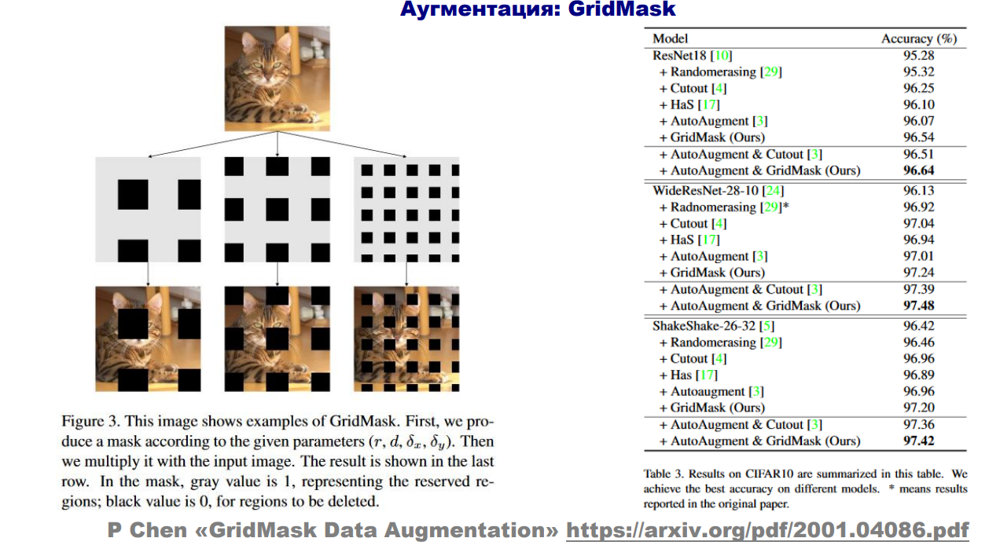

# Ensembles

- If you want to benefit from NN ensembling, each model in that ensemble must be trained on similar distribution

Ensemble types:

- Pseudo-ensemble (common conv part, different heads)
- True ensemble of independent models (benefit is +2%, as usual)
- True ensemble of independent models with weight averaging (**almost never works**)
- Snapshot Ensemble - average the same model but on different stages of training (take model's snapshot after every epoch, after train is finished - take N best shapshots (according to loss value) and average their weights)

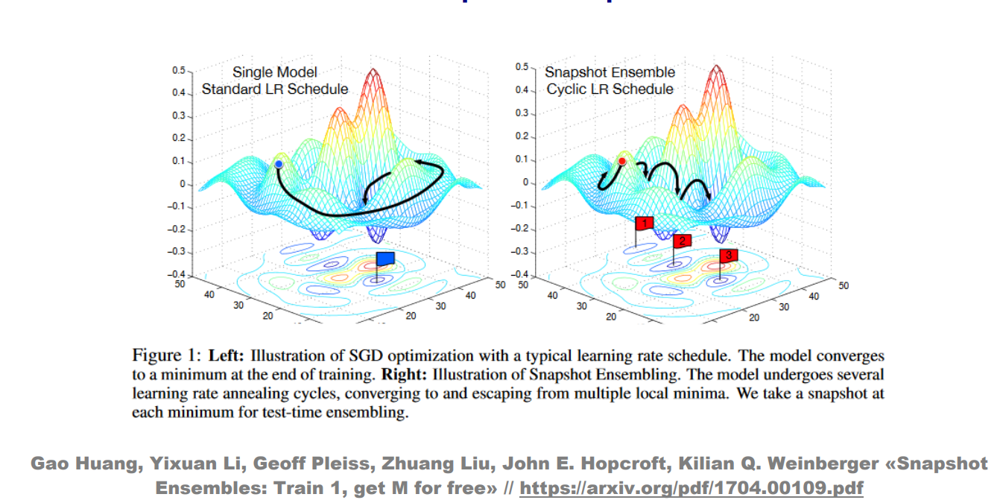

- Stochastic Weight Average (averaging weights of model every C iterations)

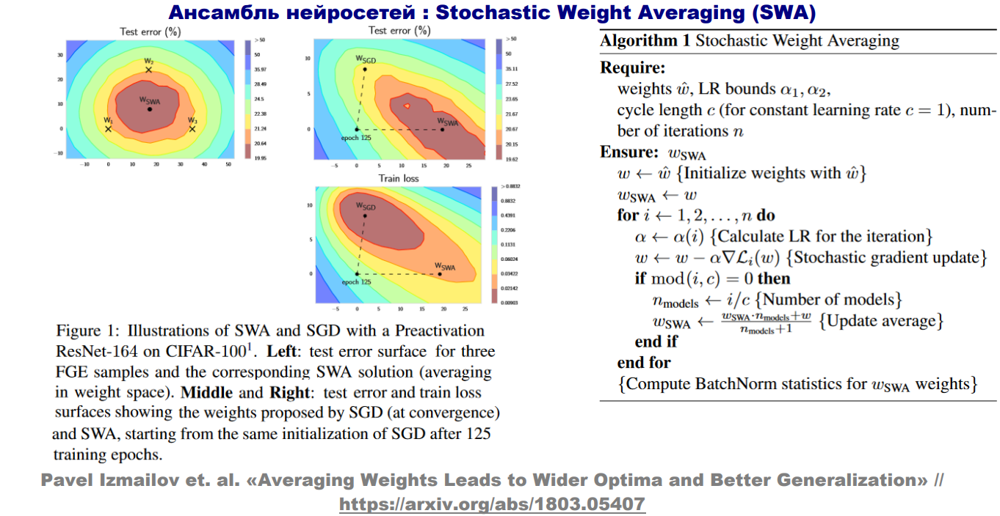

Adversarial ensemble

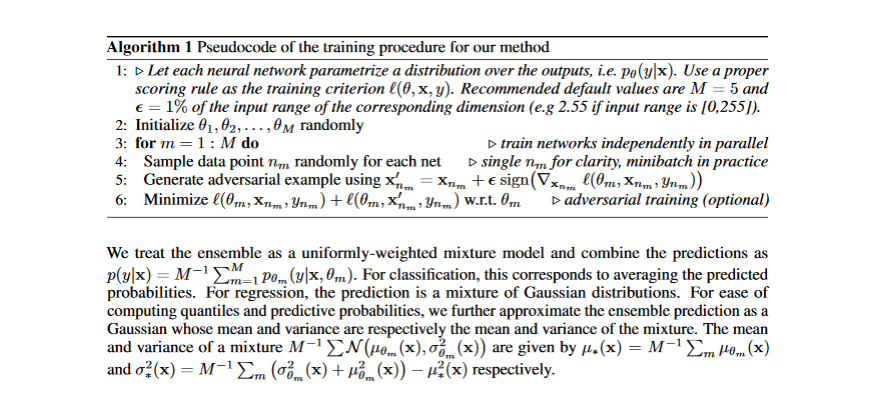

Main idea: for every model in ensemble randomly take object X, calculate loss gradient for it and create object X' = X + e * sign(grad), where e ~ 0.01. Than minimze loss L(W, X, y) + L(W, X', y) w.r.t W

In another words - we take an object, "spoil" it and minimize loss for the sum of base object and "spoiled" object.

On inference stage we basically average the prediction of all models in ensemble for every object.

Ensembles performance result comparing

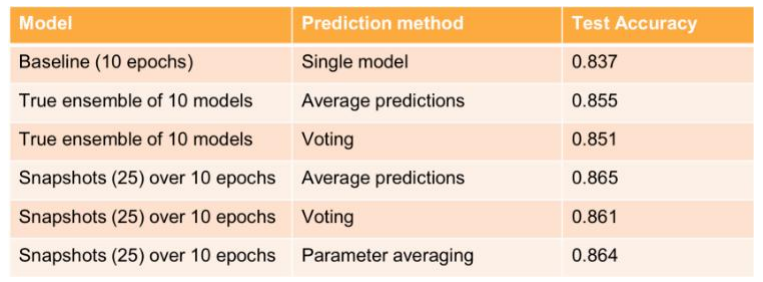

# NN problems diagnostics

Debugging in PyTorch
https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/guide3/Debugging_PyTorch.html

- check if neurons outputs have high values on some objects before training (if they are - Batch Norm)
- check that NN converges on small chunk of the data (~100-500 objects)
- numeral check (just check the gradients buy comparing of calculation and analytical results):

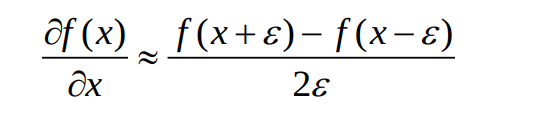

where 0 < e << 1

- check how fast NN weights change after every epoch (must be 0.1-1%), if they change too fast or too slow - increase/decrease LR
- check train/test loss plot

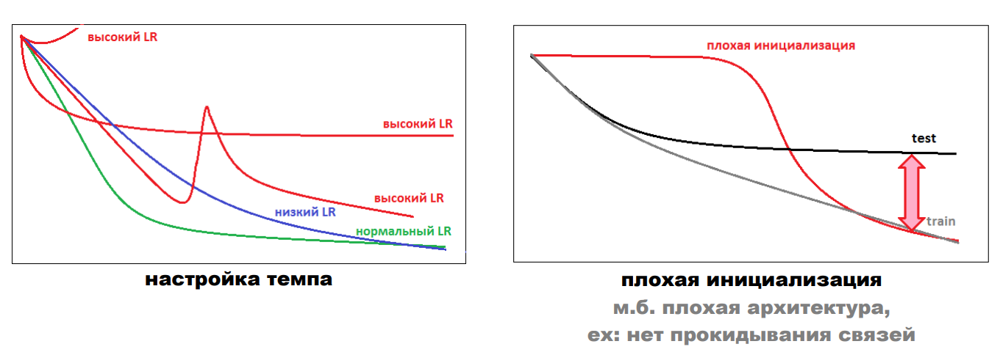

Red lines on the left picture mean too high LR, blue line on the left picture means low LR, green line on the left picture means normal LR

Red line on the right picture means bad initialization (often, but not always) or bad NN's architecture (like no residual connections).

If we have a huge gap between train and test lines => ovefitting => increase regularization

If we have a small gap between train and test lines => increase model complexity

- visualization of neurons activations

Build samples/hidden neurons activations plot.
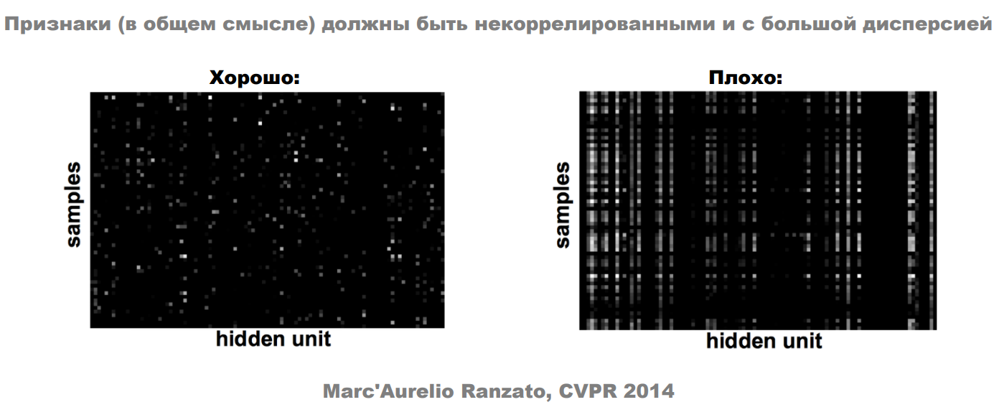

Neuron activations must be uncorrelated and have a big variance (left picture).

If picture looks like right - that means that we have neurons than act similary on the same objects and we have an objects on which no neuron is activated (this happens sometimes but when it happens too frequently - that's bad)

- visualization of ConvNN filters

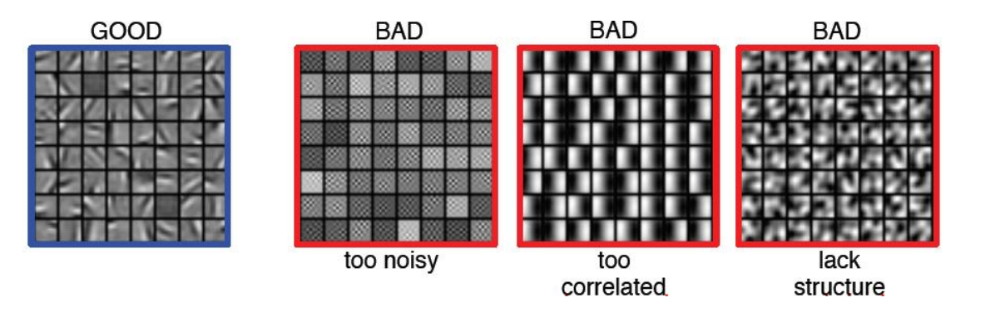

Good filters must have a structure and be uncorrelated

What else to check?

- loss/accuracy/task metric on train/validation
- distribution of gradients on every layer
- neuron activation histograms
- time of every iteration (it must remain almost the same, if it's not - maybe we have memory issues with GPU/RAM/SSD/HDD
- training progress (when any patterns begin to appear)

# Learning rate

- higher rate - higher training speed, but may miss the minimum
- lower rate - lower training speed, but the probability of finding of the minimum increases

Recommendations:
- deeper layer - smaller LR
- smaller batch - smaller LR
- SGD: 0.1
- Adam: 1e-3
- Adam + transformer: 1e-5

Adjustment of the learning rate

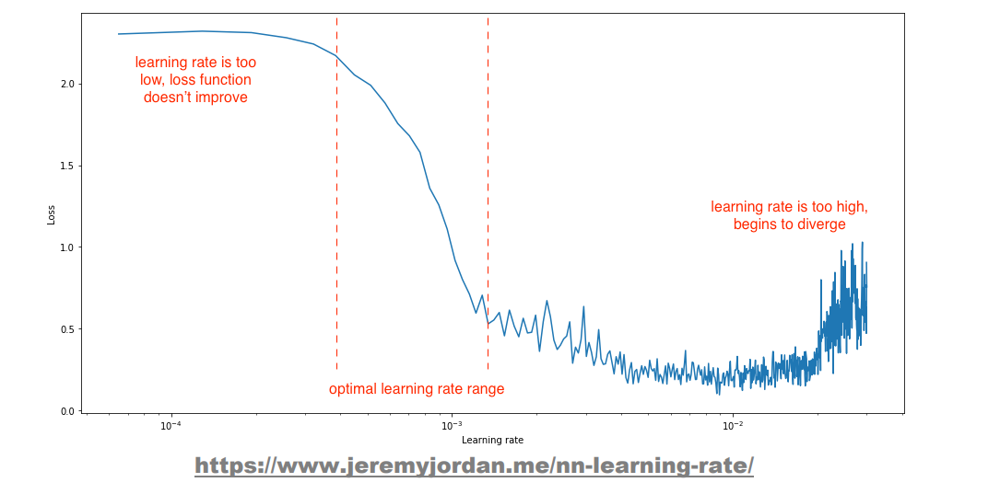

Idea: increase LR after every batch, find the best LR after looking on the resulting plot

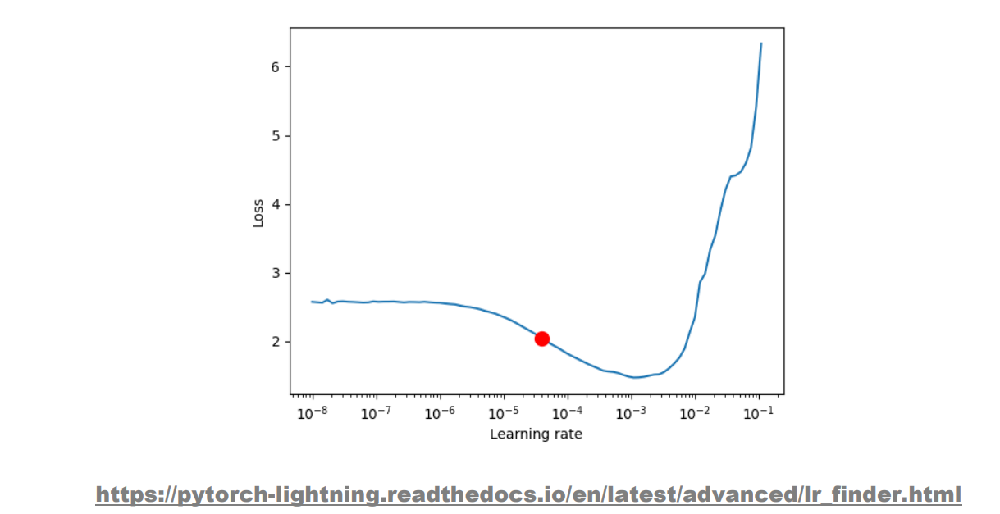

Already solved with Pytorch lr_finder, for Tensorflow can be googled

One more idea: 
- decrease LR after reaching the plateau (loss doesn't decrease after N epochs) or other specific condition
- increase LR after reaching the saddle point (loss may move slightly up/down but loss average value doesn't decrease)

Use *torch.optim.lr_scheduler* for that or *tf.keras.callbacks.LearningRateScheduler*

Scenarios of LR changing

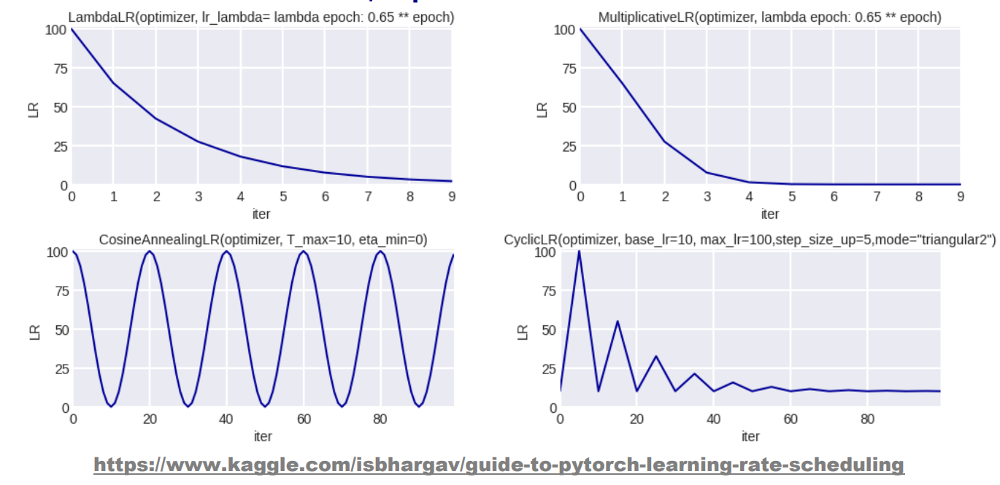

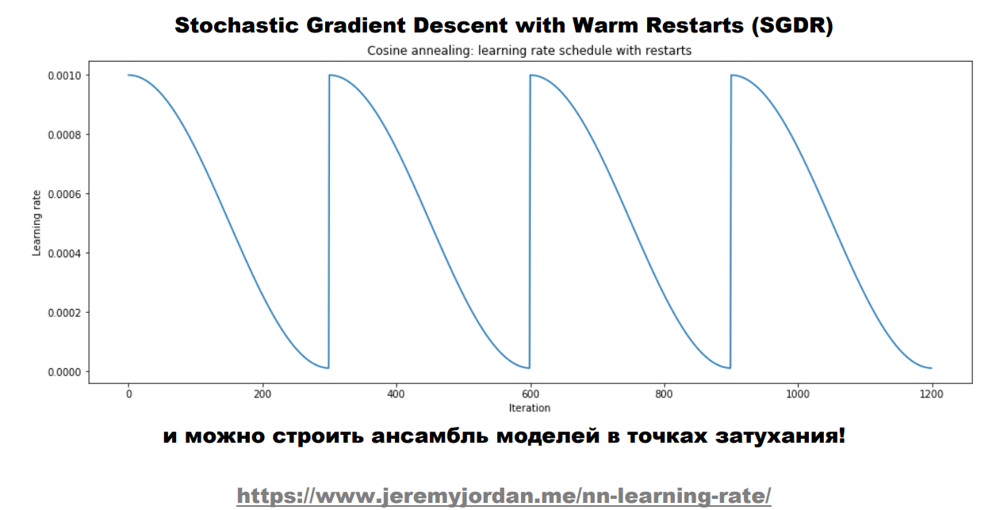

Can build Snapshot ensemble in the vanishing points!

Different layers - different LR

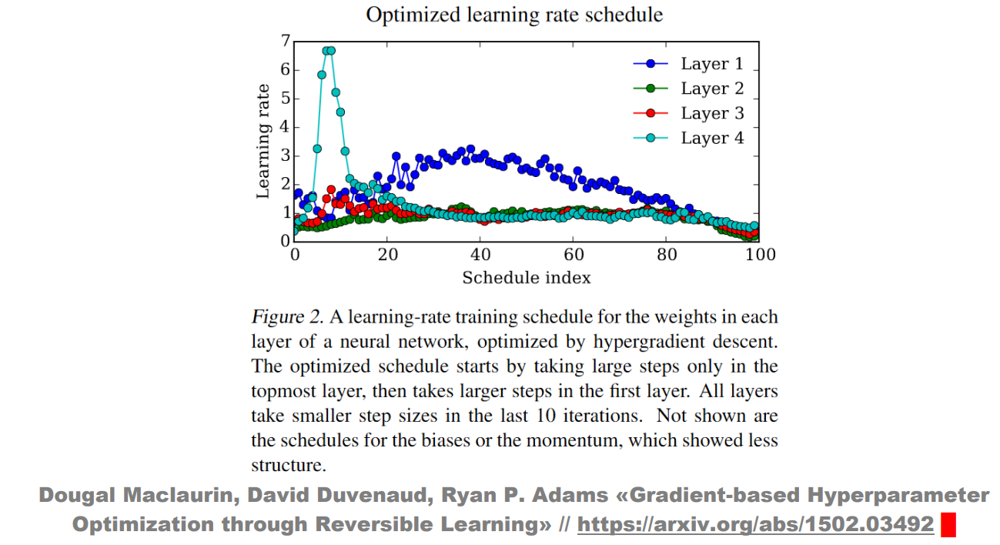

Dependence between LR, train/test loss and train set size

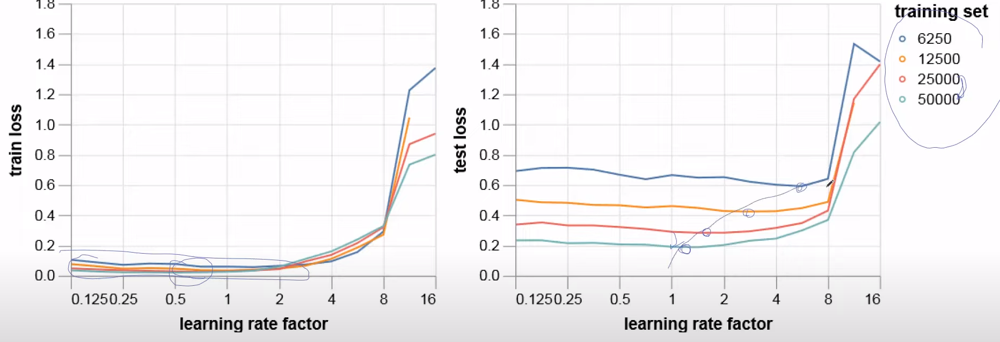

- the more dataset - the smaller test loss (obviously)
- optimal LR is smaller for the bigger dataset 

Test loss has high peaks on train/test plot - LR too high

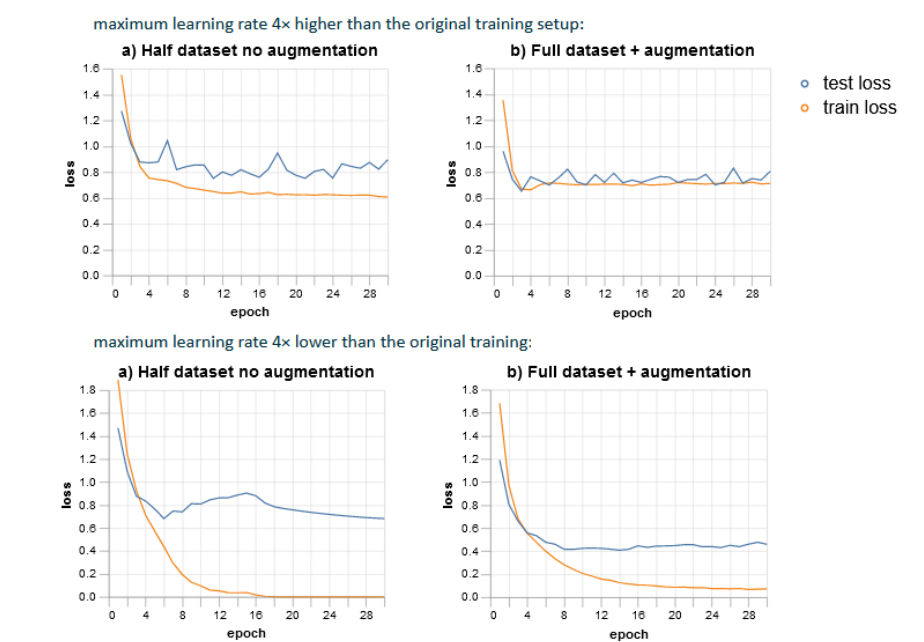

# Transfer learning


We need a lot of data to train NN. If we haven't enough data - use transfer learning!

Freeze all NN layers except head (or train them too with small LR) and train the head only on your data.


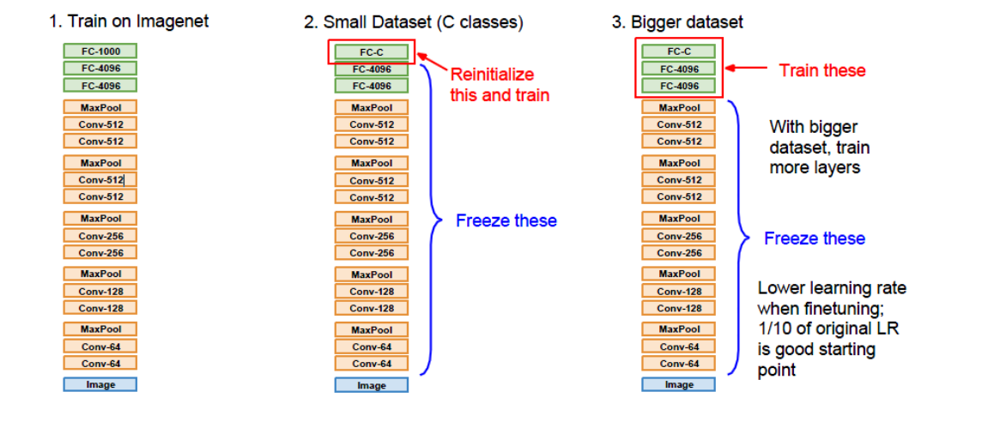

You can also don't use the head at all and put features from your NN's body to another model (like Random Forest or Gradient Boosting) 

# Pruning

If some neuron's outputs are almost always zero - we can delete them and retrain the NN again.
Another technique is gradual deleting of useless neurons with retraining on every iteration.

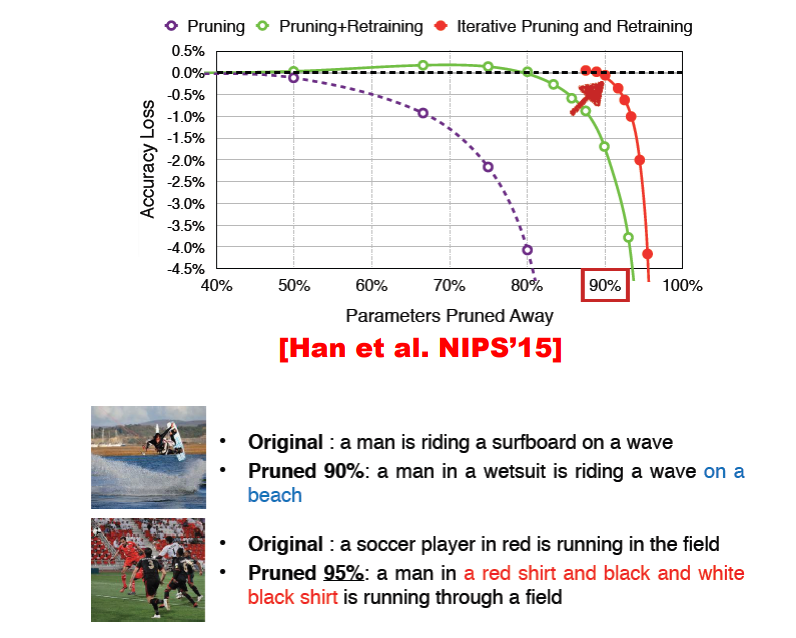

# Hyperparameter optimization

Random search is better. 

It's better because on every iteration we select completely different values for every parameter while for Grid search there is a high probability to cap the number of distinct values of some of parameters to be tested with some small number.

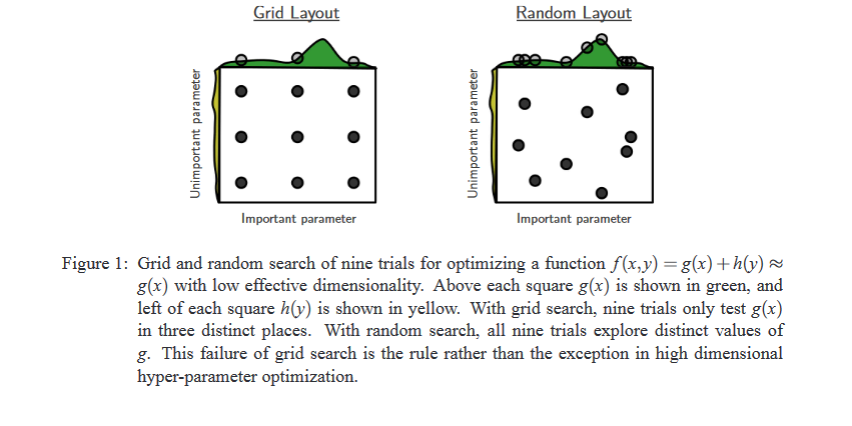

There are also advanced methods like Bayesian optimization.

Can read about this here

https://myrtle.ai/learn/how-to-train-your-resnet-5-hyperparameters/

# Timing 

How much time take different NN layers depending on batch size?

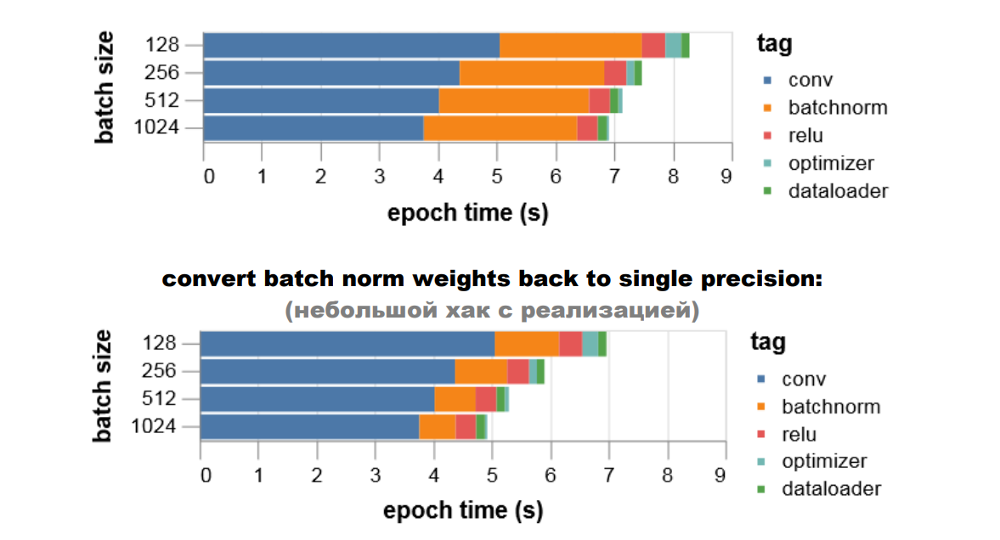

Convolution layer and BatchNorm take a lot of time. 

BatchNorm time can be decrease with converting BN weights back to single precision (FP32 instead of FP16).

# How to train RNN?

### Simple train

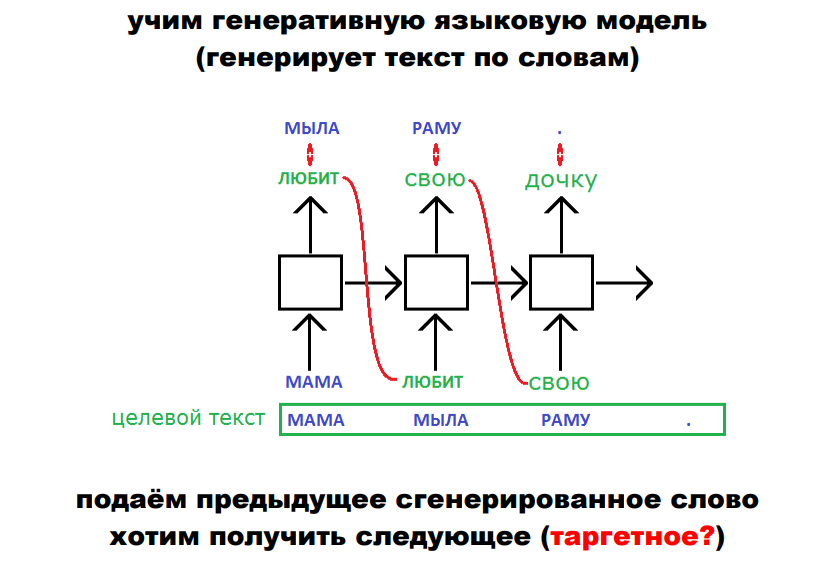

- send previously generated word to RNN block, count loss between next generated word and target word

### Teacher forcing

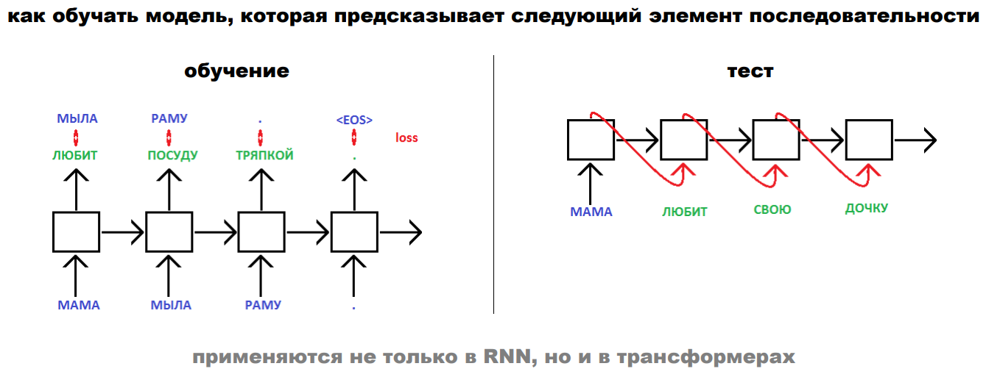

- teacher forcing (train): send target word to the block, count loss between new generated word and the next target word
- free running (test): send previously generated word to the block, count loss between new generated word and the next target word

Advantages:

- train faster
- can be used for pretraning

Disadvantages:

- train and test modes differ
- error accumulates

### Professor Forcing

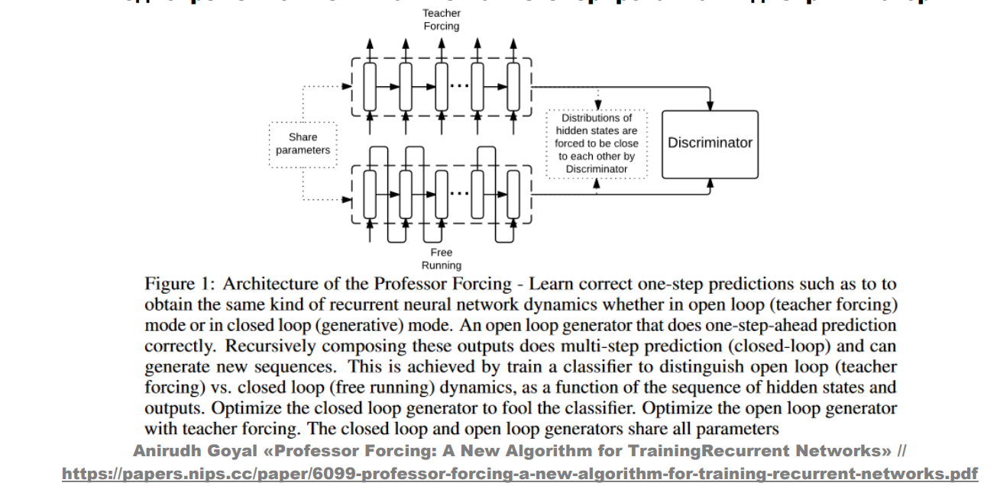

Main idea: run two copies of the same net in to modes (teacher forcing and free running) with the same weights. Use special model (discriminator) that forces distributions of hidden states of both models to be close to each other. So eventually model acts similarily on train and test.

### Scheduled sampling

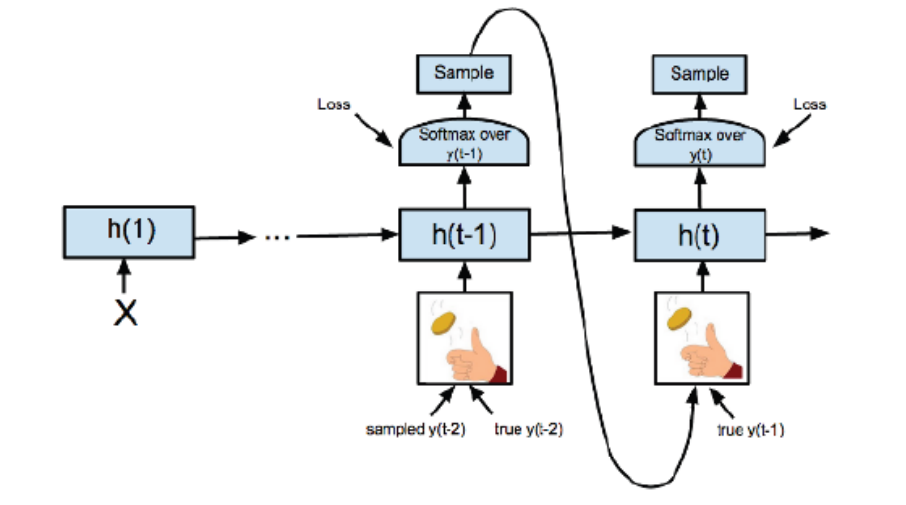

Main idea: with probability p send previously generated word to RNN block and probability 1-p send target word to RNN block

### RNN advices

How to avoid exploding gradients?
- regularization (dropout, batch normalization, zoneout - randomly replace current hidden state with hidden state from previous step)
- gradient clipping
- teacher forcing
- truncate number of step of backpropagation
- initialize weight with orthogonal matrix (training of RNN for N round leads to multiplying weight matrix on itself N times, so it's would be better for this weight matrix to be orthogonal cause it can be decomposed via spectral clustering to M = U λ U<sup>-1</sup> (where λ is eigenvalue and is equal to -1 or 1 for orthogonal matrix) and M <sup>N</sup> = U λ<sup>N</sup> U<sup>-1</sup>)

How to avoid vanishing gradients?

- special blocks (gated self-loops for LSTM and GRU)
- leaky integration units

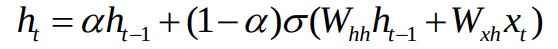

- vanishing gradient regularization
- initialize weight with orthogonal matrix


Parameters that are optimal for LSTM may be not optimal for GRU

# Practical advices

- start with simple architectures and methods
- start with small amount of data
- choose correct architecture
- more weights and layers => more complicate NN => more time to train, higher risk of overfitting
- correct initialization (e.g. in tasks with class disbalance initialize weights in the last layer to make it to give a small probability to the smaller class, and not to select the bigger class all the time) 
- use methods for dealing with overfitting
- if you have enough data - maybe you don't need to deal with overfitting, so if you can - collect the data!
- use pretrained models
- **train longer** (try at least x10 epochs, this may help)
- **LR is the most important parameter**, better to decrease it
- ** if increase batch size - increase LR too **
- use parameter optimization
- visualize everything!
- watch multiple metrics (especially interpretable metrics like precision/accuracy)
- weight values should change on 0.1-1% after every epoch
- if something doesn't work - decrease dimensionality (use PCA or just low the resolution of the pictures)
- if something doesn't work - increase/decrease the NN complexity (**no more than one change at a time!**)
- **Dropout and BN aren't a good friends**, be carefull when combining them together!
- don't trust to the complicate LR changing rules (most of the SOTA was created by training with simple rules of LR decreasing)
- static dropconnect - increase hidden level size to a huge number (e.g. 4096 neurons) and drop 99% of it’s connections with previous layer
- Adam is almost always good, if it's not - SGD + momentum
- use SWA or EMA - you can achieve significantly better generalization at virtually no additional cost

# Stupid mistakes (for Pytorch)

- forget to change train/eval modes
- forget to make zero_grad() before backward() 
- nn.CrossEntropyLoss = nn.LogSoftmax + nn.NLLLoss - you don't need to put softmax before it
- forget that nn.Softmax has dim parameter and assign it incorrectly - just use nn.Softmax(dim=-1)
- add extra layers to forward pass (e.g. nn.Embedding - it will be new on every forward pass)
- forget to test NN with different hyperparameters - try to change everything, maybe your model will be broken at some combinations of these parameters
- forget to use special modules for layers concatenating like nn.ModuleList and nn.Sequential
- call .to(device) inside of NN initialization module
- ignore correct initialization in deep NNs - initialization is critical for deep architechtures